In [1]:
import pyvinecopulib as pv
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as scs
from Ratio import *
from tqdm import tqdm
from statsmodels.distributions.empirical_distribution import ECDF as fit_ecdf
from scipy.special import logsumexp

def emp_cdf(v, u):
    """ evaluate the empirical copula at points v using the samples u"""
    # cdf is evaluated at points v, v has to be a MxD vector in [0,1]^D, cdf is evaluated at these points
    # u are samples from model NxD vector in [0,1]^D, u should be very large
    # larger u will lead to better estimation of the empirical copula but slows down computation
    cdf_vals = np.empty(shape=(len(v)))
    for i in range(v.shape[0]):
        cdf_vals[i] = np.sum(np.all(u<=v[[i],:], axis=1))
    return cdf_vals/len(u)

In [2]:
def sample(cop_name, nsamples, params):
    if cop_name == "gaussian":
        corrMatrix = params["corrMatrix"]
        copula = pv.Bicop(family=pv.BicopFamily.gaussian, parameters=corrMatrix)
    elif cop_name == "student":
        corrMatrix = params["corrMatrix"]
        nu = params["nu"]
        copula = pv.Bicop(family=pv.BicopFamily.student, parameters=[corrMatrix, nu])
    elif cop_name == "clayton":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.clayton, parameters=theta)
    elif cop_name == "gumbel":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.gumbel, parameters=theta)
    elif cop_name == "mixture":
        combination = params["combination"]
        copulas = [pv.Bicop(family=pv.BicopFamily[comp["type"]], parameters=comp["theta"]) for comp in combination]
        weights = [comp["weight"] for comp in combination]
        copula = pv.MixtureBicop(copulas, weights)
    else:
        raise ValueError(f"Unknown copula type: {cop_name}")
    
    return copula.simulate(nsamples)

def log_likelihood(cop_name, u1, u2, params):
    if cop_name == "gaussian":
        corrMatrix = params["corrMatrix"]
        copula = pv.Bicop(family=pv.BicopFamily.gaussian, parameters=corrMatrix)
    elif cop_name == "student":
        corrMatrix = params["corrMatrix"]
        nu = params["nu"]
        copula = pv.Bicop(family=pv.BicopFamily.student, parameters=[corrMatrix, nu])
    elif cop_name == "clayton":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.clayton, parameters=theta)
    elif cop_name == "gumbel":
        theta = params["theta"]
        copula = pv.Bicop(family=pv.BicopFamily.gumbel, parameters=theta)
    else:
        raise ValueError(f"Unknown copula type: {cop_name}")
    
    data = np.column_stack((u1, u2))
    return copula.loglik(data)

# Example usage:
params_gaussian = {"corrMatrix": [0.1]}
samples = sample("gaussian", 500, params_gaussian)
u1, u2 = samples[:, 0], samples[:, 1]
log_likelihood_value = log_likelihood("gaussian", u1, u2, params_gaussian)
print(log_likelihood_value)

3.415755630312373


In [3]:
N_TRAIN = 1000
N_TEST = 5000
N_ROUNDS = 25
np.random.seed(990109)

sims_runs_all = []
log_likelihoods_runs_all = []

for round in tqdm(range(N_ROUNDS)):
    # Generate data

    # Student-t
    corrMatrix = np.random.uniform(0.5,0.95)
    nu = np.random.uniform(2,10)

    params_student = {"corrMatrix": corrMatrix, "nu": nu}
    samples_student = sample("student", N_TRAIN + N_TEST, params_student)
    u1_student, u2_student = samples_student[:, 0], samples_student[:, 1]
    log_likelihood_student = log_likelihood("student", u1_student[N_TRAIN:], u2_student[N_TRAIN:], params_student)

    # Clayton
    theta = 2
    params_clayton = {"theta": [theta]}
    samples_clayton = sample("clayton", N_TRAIN + N_TEST, params_clayton)
    u1_clayton, u2_clayton = samples_clayton[:, 0], samples_clayton[:, 1]
    log_likelihood_clayton = log_likelihood("clayton", u1_clayton[N_TRAIN:], u2_clayton[N_TRAIN:], params_clayton)

    # Gumbel
    theta = 2
    params_gumbel = {"theta": [theta]}
    samples_gumbel = sample("gumbel", N_TRAIN + N_TEST, params_gumbel)
    u1_gumbel, u2_gumbel = samples_gumbel[:, 0], samples_gumbel[:, 1]
    log_likelihood_gumbel = log_likelihood("gumbel", u1_gumbel[N_TRAIN:], u2_gumbel[N_TRAIN:], params_gumbel)

    # Mixture of 2 gaussians (using scipy.stats: first mixture on gaussian z-space, then transform to copula u-space)
    '''
    # My mixture 
    means = [[np.random.uniform(-5, 5), np.random.uniform(-5, 5)]for _ in range(2)]
    covs = [np.random.uniform(-0.95, 0.95), np.random.uniform(-0.95, 0.95)]
    multipliers = [np.random.uniform(0.8,1.2), np.random.uniform(0.8,1.2)]
    z = np.concatenate(
        [scs.multivariate_normal.rvs(
        mean=means[i], cov=multipliers[i]*np.array([[1,covs[i]],[covs[i],1]]
        ), size=int((N_TRAIN + N_TEST)/2)) for i in range(2)])
    u_1_mix = 0.5*(scs.norm(loc=means[0][0], scale=multipliers[0]).cdf(z[:,0]) + scs.norm(loc=means[1][0], scale=multipliers[1]).cdf(z[:,0]))
    u_2_mix = 0.5*(scs.norm(loc=means[0][1], scale=multipliers[0]).cdf(z[:,1]) + scs.norm(loc=means[1][1], scale=multipliers[1]).cdf(z[:,1]))
    u_1_mix = u_1_mix[np.random.permutation(N_TRAIN + N_TEST)]
    u_2_mix = u_2_mix[np.random.permutation(N_TRAIN + N_TEST)]
    log_likelihood_top = scs.multivariate_normal.logpdf(z[N_TRAIN:], mean=means[0], cov=multipliers[0]*np.array([[1,covs[0]],[covs[0],1]])).sum() + scs.multivariate_normal.logpdf(z[N_TRAIN:], mean=means[1], cov=multipliers[1]*np.array([[1,covs[1]],[covs[1],1]]).sum()) 
    log_likelihood_bottom = '''
    # ----------------------------- IGC mixture -----------------------------
    mu_1 = np.random.uniform(-5,5,2)
    sigma_1 = (np.eye(2)+np.eye(2)[[1,0],:]*np.random.uniform(-0.95,0.95,1))*np.random.uniform(0.8,1.2)
    
    mu_2 = np.random.uniform(-5,5,2)
    sigma_2 = (np.eye(2)+np.eye(2)[[1,0],:]*np.random.uniform(-0.95,0.95,1))*np.random.uniform(0.8,1.2)

    x1 = np.random.multivariate_normal(mean=mu_1, cov=sigma_1, size=N_TRAIN+N_TEST)
    x2 = np.random.multivariate_normal(mean=mu_2, cov=sigma_2, size=N_TRAIN+N_TEST)

    X = np.vstack([x1,x2])
    np.random.shuffle(X)
    cdf_1 = fit_ecdf(X[:,0])
    cdf_2 = fit_ecdf(X[:,1])
    U = np.column_stack((cdf_1(X[:,0]), cdf_2(X[:,1])))
    
    X_train = np.vstack([np.random.multivariate_normal(mean=mu_1, cov=sigma_1, size=N_TRAIN),
                         np.random.multivariate_normal(mean=mu_2, cov=sigma_2, size=N_TRAIN)])
    np.random.shuffle(X_train)
    U_train = np.column_stack([cdf_1(X_train[:,0]), cdf_2(X_train[:,1])])

    X_test = np.vstack([np.random.multivariate_normal(mean=mu_1, cov=sigma_1, size=N_TEST),
                        np.random.multivariate_normal(mean=mu_2, cov=sigma_2, size=N_TEST)])
    np.random.shuffle(X_test)
    U_test = np.column_stack([cdf_1(X_test[:,0]), cdf_2(X_test[:,1])])
    
    u_1_mix = np.concatenate([U_train[:,0], U_test[:,0]])
    u_2_mix = np.concatenate([U_train[:,1], U_test[:,1]])  
    # ----------------------------- IGC mixture -----------------------------



    # append to list
    sims_runs_all.append([[u1_student, u2_student], [u1_clayton, u2_clayton], [u1_gumbel, u2_gumbel],[ u_1_mix, u_2_mix]])
    log_likelihoods_runs_all.append([log_likelihood_student, log_likelihood_clayton, log_likelihood_gumbel, _])

100%|██████████| 25/25 [00:02<00:00, 10.92it/s]


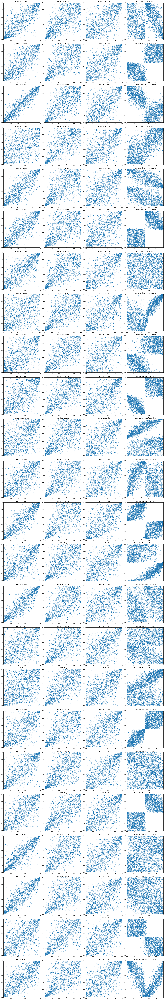

In [4]:
import matplotlib.pyplot as plt

# Assuming sims_runs_all is already populated with the samples

fig, axes = plt.subplots(24, 4, figsize=(20, 120))
axes = axes.flatten()

sample_types = ["Student-t", "Clayton", "Gumbel", "Mixture of Gaussians"]

for i in range(24):
    for j in range(4):
        ax = axes[i * 4 + j]
        u1, u2 = sims_runs_all[i][j]
        ax.scatter(u1, u2, s=1)
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_title(f'Round {i+1}, {sample_types[j]}')

plt.tight_layout()
plt.show()

In [5]:
ratios = []

for r,run in tqdm(enumerate(sims_runs_all)):
    # run = [u1_student, u2_student], [u1_clayton, u2_clayton], [u1_gumbel, u2_gumbel],[ u_1_mix, u_2_mix]
    for u,u1_u2 in enumerate(run):
        # u1_u2 = [u1, u2]
        z1,z2 = scs.norm.ppf(u1_u2[0][:N_TRAIN]),scs.norm.ppf(u1_u2[1][:N_TRAIN])
        p_data = np.column_stack((z1,z2))
        p_data = np.nan_to_num(p_data, nan=0, posinf=0, neginf=0)
        q_data = np.random.randn(50000,2)
        # Fit Ratio copula
        ratio = Ratio(h_dim=100, in_dim=2, h_layers=2, normalising_cst=True)
        #optimizer = torch.optim.Adam(ratio.parameters())
        optimizer = torch.optim.Adam(
            [{'params': [param for param in ratio.parameters() if param is not ratio.c]},
            {'params': [ratio.c], 'lr': 0.001}]  # Adjust the learning rate for ratio.c here
        )
        #if ratio.normalising_cst:
        #    optimizer.add_param_group({'params': ratio.c})

        for epoch in (range(501)):
            optimizer.zero_grad()
            r_p = ratio(torch.tensor(p_data).float())
            r_q = ratio(torch.tensor(np.random.randn(p_data.shape[0],2)).float())
            #loss = (-(r_p /(1+r_p)).log() - (1/(1+r_q)).log() ).mean()
            loss = loss_nce(r_p, r_q, p_data.shape[0], q_data.shape[0])
            loss.backward()
            optimizer.step()
            if epoch % 100 == 0 and epoch > 0:
                with torch.no_grad():
                    if True:#epoch==500:# check the value and gradient of the normalising constant
                        print(f'Epoch {epoch}, normalising constant {ratio.c.item()}', ratio.c.grad.item())
                    #check if loss is not a number
                    if torch.isnan(loss):
                        print(r,u,'NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
                    #print(f'Epoch {epoch}, loss {loss.item()}')
        print('run',r,'cop_u',u,'DONE')
        ratios.append(ratio)


0it [00:00, ?it/s]

Epoch 100, normalising constant 1.0050194263458252 -0.0016528964042663574
Epoch 200, normalising constant 1.003404140472412 0.0681312084197998
Epoch 300, normalising constant 1.002195954322815 -0.0425112247467041
Epoch 400, normalising constant 1.0006271600723267 0.084877610206604
Epoch 500, normalising constant 0.9982812404632568 -0.03549540042877197
run 0 cop_u 0 DONE
Epoch 100, normalising constant 0.9998114109039307 -0.04231148958206177
Epoch 200, normalising constant 0.9962236285209656 -0.10824280977249146
Epoch 300, normalising constant 0.9958552718162537 -0.062303006649017334
Epoch 400, normalising constant 0.9958484172821045 0.13014328479766846
Epoch 500, normalising constant 0.9956024885177612 0.12593340873718262
run 0 cop_u 1 DONE
Epoch 100, normalising constant 1.0029364824295044 -0.034489572048187256
Epoch 200, normalising constant 1.002488136291504 0.17843949794769287
Epoch 300, normalising constant 1.0008925199508667 0.03503096103668213
Epoch 400, normalising constant 1.0

1it [00:16, 16.03s/it]

Epoch 500, normalising constant 1.0128720998764038 0.01879018545150757
run 0 cop_u 3 DONE
Epoch 100, normalising constant 1.0125068426132202 0.053996741771698
Epoch 200, normalising constant 1.0116404294967651 0.03686392307281494
Epoch 300, normalising constant 1.0103545188903809 -0.06362521648406982
Epoch 400, normalising constant 1.0087368488311768 -0.16430950164794922
Epoch 500, normalising constant 1.0076719522476196 0.02911776304244995
run 1 cop_u 0 DONE
Epoch 100, normalising constant 1.0017495155334473 0.06609499454498291
Epoch 200, normalising constant 1.0004534721374512 -0.0509490966796875
Epoch 300, normalising constant 1.0000629425048828 -0.008907496929168701
Epoch 400, normalising constant 1.0003583431243896 -0.038859665393829346
Epoch 500, normalising constant 1.000105619430542 -0.05289876461029053
run 1 cop_u 1 DONE
Epoch 100, normalising constant 1.0079052448272705 -0.07568520307540894
Epoch 200, normalising constant 1.0073331594467163 0.1031685471534729
Epoch 300, norma

2it [00:32, 16.08s/it]

Epoch 500, normalising constant 1.0088162422180176 -0.07238143682479858
run 1 cop_u 3 DONE
Epoch 100, normalising constant 1.0168286561965942 -0.024529099464416504
Epoch 200, normalising constant 1.0170992612838745 -0.17077189683914185
Epoch 300, normalising constant 1.0175538063049316 0.06450331211090088
Epoch 400, normalising constant 1.0176717042922974 0.12475723028182983
Epoch 500, normalising constant 1.0168828964233398 -0.08913570642471313
run 2 cop_u 0 DONE
Epoch 100, normalising constant 1.009113073348999 0.05191701650619507
Epoch 200, normalising constant 1.009481430053711 -0.03001934289932251
Epoch 300, normalising constant 1.0100258588790894 -0.05980628728866577
Epoch 400, normalising constant 1.0094512701034546 -0.00424879789352417
Epoch 500, normalising constant 1.010002851486206 0.049471259117126465
run 2 cop_u 1 DONE
Epoch 100, normalising constant 1.0068026781082153 0.006070137023925781
Epoch 200, normalising constant 1.0066413879394531 -0.010978162288665771
Epoch 300, 

3it [00:48, 16.10s/it]

Epoch 500, normalising constant 1.0079861879348755 -0.0741966962814331
run 2 cop_u 3 DONE
Epoch 100, normalising constant 1.0012859106063843 0.01803576946258545
Epoch 200, normalising constant 0.9993146657943726 -0.031857073307037354
Epoch 300, normalising constant 0.9969851970672607 -0.07970696687698364
Epoch 400, normalising constant 0.9959486722946167 0.028035461902618408
Epoch 500, normalising constant 0.9950202703475952 0.04184246063232422
run 3 cop_u 0 DONE
Epoch 100, normalising constant 1.0124250650405884 -0.010707437992095947
Epoch 200, normalising constant 1.0118802785873413 0.053532302379608154
Epoch 300, normalising constant 1.0109151601791382 0.06405001878738403
Epoch 400, normalising constant 1.009511947631836 0.06534451246261597
Epoch 500, normalising constant 1.0086359977722168 0.07752883434295654
run 3 cop_u 1 DONE
Epoch 100, normalising constant 1.0048041343688965 0.059259891510009766
Epoch 200, normalising constant 1.005222201347351 0.03104954957962036
Epoch 300, nor

4it [01:05, 16.72s/it]

Epoch 500, normalising constant 1.008610725402832 0.04062962532043457
run 3 cop_u 3 DONE
Epoch 100, normalising constant 1.0285106897354126 0.03345787525177002
Epoch 200, normalising constant 1.0281906127929688 0.056040942668914795
Epoch 300, normalising constant 1.027433156967163 -0.06673812866210938
Epoch 400, normalising constant 1.0272834300994873 -0.11765670776367188
Epoch 500, normalising constant 1.0275620222091675 0.03356051445007324
run 4 cop_u 0 DONE
Epoch 100, normalising constant 1.0117806196212769 0.06124156713485718
Epoch 200, normalising constant 1.0105006694793701 -0.11793786287307739
Epoch 300, normalising constant 1.0105273723602295 0.02292168140411377
Epoch 400, normalising constant 1.0100648403167725 0.07316285371780396
Epoch 500, normalising constant 1.0098724365234375 -0.02841925621032715
run 4 cop_u 1 DONE
Epoch 100, normalising constant 1.006518006324768 0.016761481761932373
Epoch 200, normalising constant 1.0078166723251343 0.011596739292144775
Epoch 300, norma

5it [01:23, 16.89s/it]

Epoch 500, normalising constant 1.0031769275665283 0.053029775619506836
run 4 cop_u 3 DONE
Epoch 100, normalising constant 1.014237880706787 0.05530482530593872
Epoch 200, normalising constant 1.0137543678283691 0.06895196437835693
Epoch 300, normalising constant 1.013203501701355 -0.1329553723335266
Epoch 400, normalising constant 1.0131953954696655 0.04629528522491455
Epoch 500, normalising constant 1.0122990608215332 0.00011479854583740234
run 5 cop_u 0 DONE
Epoch 100, normalising constant 1.0033732652664185 -0.046492576599121094
Epoch 200, normalising constant 1.004036545753479 -0.11792010068893433
Epoch 300, normalising constant 1.0036007165908813 -0.08136284351348877
Epoch 400, normalising constant 1.0044405460357666 -0.01400536298751831
Epoch 500, normalising constant 1.004860758781433 -0.013556718826293945
run 5 cop_u 1 DONE
Epoch 100, normalising constant 1.0007318258285522 -0.06915944814682007
Epoch 200, normalising constant 0.9995408654212952 -0.037069499492645264
Epoch 300,

6it [01:40, 17.05s/it]

Epoch 500, normalising constant 1.0072693824768066 -0.0069193243980407715
run 5 cop_u 3 DONE
Epoch 100, normalising constant 1.0067534446716309 0.109702467918396
Epoch 200, normalising constant 1.0062978267669678 -0.005276143550872803
Epoch 300, normalising constant 1.005470871925354 -0.0001633167266845703
Epoch 400, normalising constant 1.0038843154907227 -0.1006326675415039
Epoch 500, normalising constant 1.003075361251831 0.04276859760284424
run 6 cop_u 0 DONE
Epoch 100, normalising constant 1.009466528892517 -0.022347867488861084
Epoch 200, normalising constant 1.008420467376709 -0.03622865676879883
Epoch 300, normalising constant 1.0079725980758667 0.026420652866363525
Epoch 400, normalising constant 1.0072197914123535 0.0922389030456543
Epoch 500, normalising constant 1.0055556297302246 0.025651633739471436
run 6 cop_u 1 DONE
Epoch 100, normalising constant 1.0059778690338135 0.03558605909347534
Epoch 200, normalising constant 1.0023409128189087 -0.023105084896087646
Epoch 300, n

7it [01:56, 16.86s/it]

Epoch 500, normalising constant 1.0050671100616455 0.029312074184417725
run 6 cop_u 3 DONE
Epoch 100, normalising constant 1.0028936862945557 0.009572446346282959
Epoch 200, normalising constant 1.0014621019363403 0.0822942852973938
Epoch 300, normalising constant 0.9995200037956238 0.029111504554748535
Epoch 400, normalising constant 0.9981520771980286 0.0012589693069458008
Epoch 500, normalising constant 0.9961124062538147 0.024057745933532715
run 7 cop_u 0 DONE
Epoch 100, normalising constant 1.0179450511932373 0.020816922187805176
Epoch 200, normalising constant 1.0162583589553833 -0.003605961799621582
Epoch 300, normalising constant 1.0143816471099854 0.04560309648513794
Epoch 400, normalising constant 1.013613224029541 -0.03151369094848633
Epoch 500, normalising constant 1.0110094547271729 -0.054088056087493896
run 7 cop_u 1 DONE
Epoch 100, normalising constant 1.0120450258255005 0.0660015344619751
Epoch 200, normalising constant 1.0122997760772705 0.06323844194412231
Epoch 300, 

8it [02:13, 16.64s/it]

Epoch 500, normalising constant 1.0016286373138428 0.007030129432678223
run 7 cop_u 3 DONE
Epoch 100, normalising constant 1.0122230052947998 -0.04851573705673218
Epoch 200, normalising constant 1.0113948583602905 -0.08699685335159302
Epoch 300, normalising constant 1.011306881904602 0.12922805547714233
Epoch 400, normalising constant 1.0090886354446411 -0.0377650260925293
Epoch 500, normalising constant 1.0088082551956177 0.14226341247558594
run 8 cop_u 0 DONE
Epoch 100, normalising constant 1.0074676275253296 0.09671425819396973
Epoch 200, normalising constant 1.0064566135406494 -0.014210283756256104
Epoch 300, normalising constant 1.005855917930603 -0.015764057636260986
Epoch 400, normalising constant 1.005953311920166 0.07561647891998291
Epoch 500, normalising constant 1.0048871040344238 0.010782003402709961
run 8 cop_u 1 DONE
Epoch 100, normalising constant 1.00051748752594 -0.06982970237731934
Epoch 200, normalising constant 1.0008264780044556 0.0037830471992492676
Epoch 300, nor

9it [02:29, 16.55s/it]

Epoch 500, normalising constant 0.9938737750053406 -0.06589514017105103
run 8 cop_u 3 DONE
Epoch 100, normalising constant 1.007377028465271 -0.0939873456954956
Epoch 200, normalising constant 1.0078076124191284 0.014969706535339355
Epoch 300, normalising constant 1.0072168111801147 -0.010818004608154297
Epoch 400, normalising constant 1.0067498683929443 -0.007486164569854736
Epoch 500, normalising constant 1.0058231353759766 0.05335873365402222
run 9 cop_u 0 DONE
Epoch 100, normalising constant 0.994658350944519 0.0622103214263916
Epoch 200, normalising constant 0.9949139952659607 0.025431156158447266
Epoch 300, normalising constant 0.9956265687942505 0.030031442642211914
Epoch 400, normalising constant 0.9949957728385925 0.050099849700927734
Epoch 500, normalising constant 0.995635986328125 0.044177234172821045
run 9 cop_u 1 DONE
Epoch 100, normalising constant 1.0123707056045532 0.0017392635345458984
Epoch 200, normalising constant 1.0112271308898926 0.01045072078704834
Epoch 300, n

10it [02:46, 16.83s/it]

Epoch 500, normalising constant 0.9989205002784729 0.014002084732055664
run 9 cop_u 3 DONE
Epoch 100, normalising constant 1.0172103643417358 -0.009014248847961426
Epoch 200, normalising constant 1.0180895328521729 -0.06189364194869995
Epoch 300, normalising constant 1.018344759941101 -0.004841148853302002
Epoch 400, normalising constant 1.0181758403778076 0.06854367256164551
Epoch 500, normalising constant 1.01712965965271 0.045325517654418945
run 10 cop_u 0 DONE
Epoch 100, normalising constant 1.0030734539031982 0.05373954772949219
Epoch 200, normalising constant 1.0024195909500122 -0.0959673523902893
Epoch 300, normalising constant 1.0021320581436157 -0.07875525951385498
Epoch 400, normalising constant 1.002906322479248 0.09730339050292969
Epoch 500, normalising constant 1.0031474828720093 0.05284672975540161
run 10 cop_u 1 DONE
Epoch 100, normalising constant 1.0116854906082153 0.02314591407775879
Epoch 200, normalising constant 1.0103957653045654 0.009791016578674316
Epoch 300, no

11it [03:04, 16.96s/it]

Epoch 500, normalising constant 0.9933471083641052 0.055253803730010986
run 10 cop_u 3 DONE
Epoch 100, normalising constant 1.0029679536819458 -0.029450535774230957
Epoch 200, normalising constant 1.002690076828003 -0.01567608118057251
Epoch 300, normalising constant 1.001634955406189 0.007984936237335205
Epoch 400, normalising constant 1.000689148902893 0.05081641674041748
Epoch 500, normalising constant 0.9998160004615784 0.09613579511642456
run 11 cop_u 0 DONE
Epoch 100, normalising constant 1.0009284019470215 -0.05167996883392334
Epoch 200, normalising constant 1.000749111175537 0.007310032844543457
Epoch 300, normalising constant 1.0001782178878784 -0.09487515687942505
Epoch 400, normalising constant 1.000811219215393 0.03339362144470215
Epoch 500, normalising constant 1.0010353326797485 0.0438191294670105
run 11 cop_u 1 DONE
Epoch 100, normalising constant 1.0134906768798828 -0.047702014446258545
Epoch 200, normalising constant 1.0155363082885742 -0.06801211833953857
Epoch 300, n

12it [03:21, 17.04s/it]

Epoch 500, normalising constant 0.9862348437309265 -0.015849053859710693
run 11 cop_u 3 DONE
Epoch 100, normalising constant 1.0111076831817627 0.015209376811981201
Epoch 200, normalising constant 1.0102412700653076 0.1354736089706421
Epoch 300, normalising constant 1.009113073348999 0.011300981044769287
Epoch 400, normalising constant 1.0084413290023804 -0.09804123640060425
Epoch 500, normalising constant 1.0089077949523926 0.024824917316436768
run 12 cop_u 0 DONE
Epoch 100, normalising constant 1.0066425800323486 0.013625562191009521
Epoch 200, normalising constant 1.0067205429077148 -0.006068110466003418
Epoch 300, normalising constant 1.0064829587936401 0.05898803472518921
Epoch 400, normalising constant 1.007354497909546 0.03917771577835083
Epoch 500, normalising constant 1.006603717803955 0.0001627206802368164
run 12 cop_u 1 DONE
Epoch 100, normalising constant 1.003934383392334 -0.00021135807037353516
Epoch 200, normalising constant 1.0026519298553467 -0.04307675361633301
Epoch 

13it [03:38, 17.13s/it]

Epoch 500, normalising constant 1.0100152492523193 -0.08287978172302246
run 12 cop_u 3 DONE
Epoch 100, normalising constant 1.0147230625152588 -0.0032219886779785156
Epoch 200, normalising constant 1.0142484903335571 -0.006942272186279297
Epoch 300, normalising constant 1.0130560398101807 -0.021749496459960938
Epoch 400, normalising constant 1.0117547512054443 0.011304259300231934
Epoch 500, normalising constant 1.0114492177963257 0.10203075408935547
run 13 cop_u 0 DONE
Epoch 100, normalising constant 1.0032739639282227 -0.044120192527770996
Epoch 200, normalising constant 1.0028040409088135 0.049624085426330566
Epoch 300, normalising constant 1.000982403755188 -0.012808024883270264
Epoch 400, normalising constant 0.9990292191505432 0.03860241174697876
Epoch 500, normalising constant 0.9990174770355225 -0.004000425338745117
run 13 cop_u 1 DONE
Epoch 100, normalising constant 0.9998931288719177 0.03392171859741211
Epoch 200, normalising constant 0.998717188835144 -0.04802274703979492
Ep

14it [03:56, 17.26s/it]

Epoch 500, normalising constant 0.997443437576294 -0.004256308078765869
run 13 cop_u 3 DONE
Epoch 100, normalising constant 1.0104049444198608 -0.014501810073852539
Epoch 200, normalising constant 1.0096518993377686 0.03297984600067139
Epoch 300, normalising constant 1.0099774599075317 0.09308898448944092
Epoch 400, normalising constant 1.0094934701919556 0.0487520694732666
Epoch 500, normalising constant 1.0086259841918945 -0.00298917293548584
run 14 cop_u 0 DONE
Epoch 100, normalising constant 1.0070011615753174 -0.0009860396385192871
Epoch 200, normalising constant 1.0063484907150269 -0.02616816759109497
Epoch 300, normalising constant 1.0053483247756958 0.002323925495147705
Epoch 400, normalising constant 1.004266619682312 -0.04038447141647339
Epoch 500, normalising constant 1.003353476524353 0.16142380237579346
run 14 cop_u 1 DONE
Epoch 100, normalising constant 1.008536696434021 0.08008533716201782
Epoch 200, normalising constant 1.0089608430862427 0.08406388759613037
Epoch 300, 

15it [04:24, 20.48s/it]

Epoch 500, normalising constant 0.9962709546089172 0.026363253593444824
run 14 cop_u 3 DONE
Epoch 100, normalising constant 1.0080156326293945 -0.03968697786331177
Epoch 200, normalising constant 1.0051766633987427 -0.10241138935089111
Epoch 300, normalising constant 1.0036178827285767 0.06819164752960205
Epoch 400, normalising constant 1.0018887519836426 -0.016765475273132324
Epoch 500, normalising constant 1.0013933181762695 -0.01447826623916626
run 15 cop_u 0 DONE
Epoch 100, normalising constant 1.00798499584198 0.01167374849319458
Epoch 200, normalising constant 1.0080077648162842 0.032516300678253174
Epoch 300, normalising constant 1.0078004598617554 -0.06994783878326416
Epoch 400, normalising constant 1.0072379112243652 -0.12143063545227051
Epoch 500, normalising constant 1.0073304176330566 -0.044883012771606445
run 15 cop_u 1 DONE
Epoch 100, normalising constant 1.0105056762695312 -0.01762068271636963
Epoch 200, normalising constant 1.009696125984192 -0.0242728590965271
Epoch 30

16it [04:57, 24.30s/it]

Epoch 500, normalising constant 0.9906662106513977 -0.07740479707717896
run 15 cop_u 3 DONE
Epoch 100, normalising constant 0.9972334504127502 0.010644376277923584
Epoch 200, normalising constant 0.9973880648612976 -0.03470796346664429
Epoch 300, normalising constant 0.9975127577781677 -0.01356881856918335
Epoch 400, normalising constant 0.9973291754722595 0.01063615083694458
Epoch 500, normalising constant 0.996971845626831 -0.02193772792816162
run 16 cop_u 0 DONE
Epoch 100, normalising constant 1.002530574798584 -0.07804447412490845
Epoch 200, normalising constant 1.0022660493850708 -0.012781858444213867
Epoch 300, normalising constant 1.0015829801559448 -0.042980313301086426
Epoch 400, normalising constant 1.0016648769378662 0.027380526065826416
Epoch 500, normalising constant 1.0006834268569946 0.014836490154266357
run 16 cop_u 1 DONE
Epoch 100, normalising constant 0.9995788931846619 -0.041389405727386475
Epoch 200, normalising constant 0.9976741075515747 0.009323418140411377
Epoc

17it [05:29, 26.77s/it]

Epoch 500, normalising constant 0.9888423681259155 -0.04137229919433594
run 16 cop_u 3 DONE
Epoch 100, normalising constant 1.0170303583145142 -0.006467700004577637
Epoch 200, normalising constant 1.0162283182144165 -0.05711644887924194
Epoch 300, normalising constant 1.0156011581420898 0.12720322608947754
Epoch 400, normalising constant 1.013586163520813 0.044821858406066895
Epoch 500, normalising constant 1.011366844177246 -0.03250432014465332
run 17 cop_u 0 DONE
Epoch 100, normalising constant 1.0104939937591553 -0.0992896556854248
Epoch 200, normalising constant 1.0103470087051392 0.008402705192565918
Epoch 300, normalising constant 1.010877251625061 0.009337186813354492
Epoch 400, normalising constant 1.010416030883789 0.09095251560211182
Epoch 500, normalising constant 1.0102113485336304 -0.007407426834106445
run 17 cop_u 1 DONE
Epoch 100, normalising constant 1.0228604078292847 0.011818349361419678
Epoch 200, normalising constant 1.0230454206466675 0.1107034683227539
Epoch 300, 

18it [05:56, 26.72s/it]

Epoch 500, normalising constant 1.0126211643218994 0.11853498220443726
run 17 cop_u 3 DONE
Epoch 100, normalising constant 1.0026005506515503 -0.003773331642150879
Epoch 200, normalising constant 1.004089593887329 0.02573990821838379
Epoch 300, normalising constant 1.003012776374817 0.18046021461486816
Epoch 400, normalising constant 1.0014359951019287 -0.033344268798828125
Epoch 500, normalising constant 0.9993956685066223 -0.11364692449569702
run 18 cop_u 0 DONE
Epoch 100, normalising constant 1.0041264295578003 0.10646319389343262
Epoch 200, normalising constant 1.003981590270996 0.06952208280563354
Epoch 300, normalising constant 1.0028029680252075 -0.051007747650146484
Epoch 400, normalising constant 1.0016385316848755 0.0002008676528930664
Epoch 500, normalising constant 1.0007283687591553 0.1120840311050415
run 18 cop_u 1 DONE
Epoch 100, normalising constant 1.0089125633239746 0.026565849781036377
Epoch 200, normalising constant 1.0095274448394775 0.0783301591873169
Epoch 300, n

19it [06:21, 26.14s/it]

Epoch 500, normalising constant 0.9998568296432495 -0.0029952526092529297
run 18 cop_u 3 DONE
Epoch 100, normalising constant 1.009026050567627 0.015586316585540771
Epoch 200, normalising constant 1.0096617937088013 -0.08330368995666504
Epoch 300, normalising constant 1.0094767808914185 0.014524340629577637
Epoch 400, normalising constant 1.008542537689209 0.07851314544677734
Epoch 500, normalising constant 1.0078191757202148 0.006314575672149658
run 19 cop_u 0 DONE
Epoch 100, normalising constant 1.0003087520599365 0.021007299423217773
Epoch 200, normalising constant 0.9989826679229736 -0.034532785415649414
Epoch 300, normalising constant 0.997966468334198 0.006991088390350342
Epoch 400, normalising constant 0.9977297782897949 -0.043029844760894775
Epoch 500, normalising constant 0.9977924227714539 0.013687670230865479
run 19 cop_u 1 DONE
Epoch 100, normalising constant 1.0087701082229614 0.0696948766708374
Epoch 200, normalising constant 1.0075161457061768 -0.15933966636657715
Epoch 

20it [06:44, 25.28s/it]

Epoch 500, normalising constant 0.9960591793060303 0.11068880558013916
run 19 cop_u 3 DONE
Epoch 100, normalising constant 1.0137385129928589 0.05249077081680298
Epoch 200, normalising constant 1.0138654708862305 -0.07080131769180298
Epoch 300, normalising constant 1.0151759386062622 0.03172028064727783
Epoch 400, normalising constant 1.0143442153930664 0.02299809455871582
Epoch 500, normalising constant 1.0141301155090332 -0.060589611530303955
run 20 cop_u 0 DONE
Epoch 100, normalising constant 1.0053805112838745 0.02899909019470215
Epoch 200, normalising constant 1.0040299892425537 -0.0027695894241333008
Epoch 300, normalising constant 1.0025149583816528 -0.02210533618927002
Epoch 400, normalising constant 1.002550482749939 0.020282506942749023
Epoch 500, normalising constant 1.0010522603988647 -0.06751769781112671
run 20 cop_u 1 DONE
Epoch 100, normalising constant 1.0044010877609253 -0.02897512912750244
Epoch 200, normalising constant 1.0038723945617676 0.012286067008972168
Epoch 3

21it [07:06, 24.19s/it]

Epoch 500, normalising constant 0.9966771602630615 -0.009518623352050781
run 20 cop_u 3 DONE
Epoch 100, normalising constant 1.0166609287261963 0.009033501148223877
Epoch 200, normalising constant 1.0156580209732056 -0.018000543117523193
Epoch 300, normalising constant 1.014853835105896 -0.05469191074371338
Epoch 400, normalising constant 1.0136520862579346 0.035279035568237305
Epoch 500, normalising constant 1.012056827545166 0.02711045742034912
run 21 cop_u 0 DONE
Epoch 100, normalising constant 0.998561441898346 -0.04117172956466675
Epoch 200, normalising constant 0.9985014200210571 0.05628156661987305
Epoch 300, normalising constant 0.9985632300376892 0.020495116710662842
Epoch 400, normalising constant 0.9990496635437012 0.06276923418045044
Epoch 500, normalising constant 0.9988332390785217 0.06691741943359375
run 21 cop_u 1 DONE
Epoch 100, normalising constant 1.0103659629821777 -0.054126739501953125
Epoch 200, normalising constant 1.0096606016159058 0.01897639036178589
Epoch 300

22it [07:30, 24.22s/it]

Epoch 500, normalising constant 0.9944230914115906 -0.052541375160217285
run 21 cop_u 3 DONE
Epoch 100, normalising constant 1.0013765096664429 0.022181332111358643
Epoch 200, normalising constant 1.000206470489502 -0.05177319049835205
Epoch 300, normalising constant 0.99993497133255 -0.012106835842132568
Epoch 400, normalising constant 0.9985184073448181 -0.022614896297454834
Epoch 500, normalising constant 0.9961497187614441 -0.014547348022460938
run 22 cop_u 0 DONE
Epoch 100, normalising constant 0.9995564222335815 0.0004875063896179199
Epoch 200, normalising constant 0.9967106580734253 -0.1603335738182068
Epoch 300, normalising constant 0.9969285726547241 0.016735851764678955
Epoch 400, normalising constant 0.997498631477356 0.10610169172286987
Epoch 500, normalising constant 0.9972904920578003 0.1668056845664978
run 22 cop_u 1 DONE
Epoch 100, normalising constant 1.0032039880752563 -0.0024296045303344727
Epoch 200, normalising constant 1.0014448165893555 0.08540743589401245
Epoch 

23it [07:54, 24.13s/it]

Epoch 500, normalising constant 0.9993777275085449 -0.00789576768875122
run 22 cop_u 3 DONE
Epoch 100, normalising constant 1.0137698650360107 -0.1396070122718811
Epoch 200, normalising constant 1.0135470628738403 0.02253139019012451
Epoch 300, normalising constant 1.0131653547286987 -0.002722799777984619
Epoch 400, normalising constant 1.0131479501724243 -0.011800944805145264
Epoch 500, normalising constant 1.0133360624313354 -0.07113373279571533
run 23 cop_u 0 DONE
Epoch 100, normalising constant 0.9992665648460388 0.04737728834152222
Epoch 200, normalising constant 0.9975446462631226 0.014923572540283203
Epoch 300, normalising constant 0.9971218705177307 0.029985547065734863
Epoch 400, normalising constant 0.9974662065505981 -0.050167202949523926
Epoch 500, normalising constant 0.9971956610679626 -0.07358098030090332
run 23 cop_u 1 DONE
Epoch 100, normalising constant 1.003836989402771 0.10934877395629883
Epoch 200, normalising constant 1.0036076307296753 0.02110159397125244
Epoch 3

24it [08:16, 23.46s/it]

Epoch 500, normalising constant 1.0081349611282349 0.08854377269744873
run 23 cop_u 3 DONE
Epoch 100, normalising constant 1.0045114755630493 -0.02543717622756958
Epoch 200, normalising constant 1.0045478343963623 0.06237870454788208
Epoch 300, normalising constant 1.0041968822479248 -0.0007320046424865723
Epoch 400, normalising constant 1.003169298171997 -0.05160021781921387
Epoch 500, normalising constant 1.0019570589065552 0.020667612552642822
run 24 cop_u 0 DONE
Epoch 100, normalising constant 0.9985806345939636 -0.06050962209701538
Epoch 200, normalising constant 0.9978590607643127 -0.0006930828094482422
Epoch 300, normalising constant 0.998092770576477 -0.01097571849822998
Epoch 400, normalising constant 0.9980201721191406 0.043250441551208496
Epoch 500, normalising constant 0.998051643371582 0.03566110134124756
run 24 cop_u 1 DONE
Epoch 100, normalising constant 1.0187991857528687 0.04540824890136719
Epoch 200, normalising constant 1.0194920301437378 0.014824330806732178
Epoch 3

25it [08:45, 21.03s/it]

Epoch 500, normalising constant 0.9973220229148865 -0.024959087371826172
run 24 cop_u 3 DONE


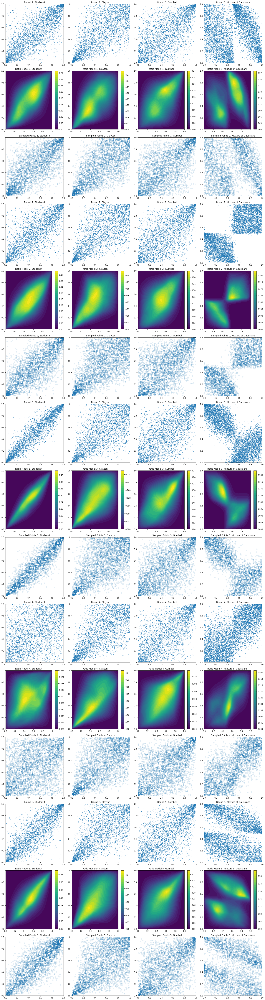

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import scipy.stats
from tqdm import tqdm
from scipy.special import logsumexp

def sample_ratio(ratio, n):
    '''
    Sample from the ratio copula with Sampling Importance Resampling.
    '''
    z = np.random.randn(n, 2)
    r_log = np.log(ratio(torch.tensor(z).float()).detach().numpy())
    sims = np.random.choice(np.arange(n), size=n, p=np.exp(r_log - logsumexp(r_log)).flatten(), replace=True)
    return scipy.stats.norm.cdf(z[sims])

fig, axes = plt.subplots(int(75/5), 4, figsize=(20, int(375/5)))
axes = axes.flatten()

sample_types = ["Student-t", "Clayton", "Gumbel", "Mixture of Gaussians"]

# Plot the true samples, the ratio models, and the sampled points
for i in range(5):
    for j in range(4):
        # Plot the true samples
        ax_true = axes[i * 12 + j]
        u1, u2 = sims_runs_all[i][j]
        ax_true.scatter(u1, u2, s=1)
        ax_true.set_xlim(0, 1)
        ax_true.set_ylim(0, 1)
        ax_true.set_title(f'Round {i+1}, {sample_types[j]}')

        # Plot the ratio models
        ax_ratio = axes[i * 12 + 4 + j]
        
        # Create a grid for plotting
        x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
        z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
        gauss = scipy.stats.norm.pdf(x) * scipy.stats.norm.pdf(y)

        # Get the ratio
        r = ratios[i * 4 + j](z.float()).detach().numpy()
        Z = (r.reshape(100, 100)) * gauss
        contour = ax_ratio.contourf(scipy.stats.norm.cdf(x), scipy.stats.norm.cdf(y), Z, levels=30)
        ax_ratio.set_xlim(0, 1)
        ax_ratio.set_ylim(0, 1)
        ax_ratio.set_title(f'Ratio Model {i+1}, {sample_types[j]}')
        fig.colorbar(contour, ax=ax_ratio)
        
        # Plot the sampled points
        ax_sampled = axes[i * 12 + 8 + j]
        samples_test = sample_ratio(ratios[i * 4 + j], 5000)
        ax_sampled.scatter(samples_test[:, 0], samples_test[:, 1], alpha=0.1)
        ax_sampled.set_xlim(0, 1)
        ax_sampled.set_ylim(0, 1)
        ax_sampled.set_title(f'Sampled Points {i+1}, {sample_types[j]}')

plt.tight_layout()
plt.show()

### Sampling with HMC

In [7]:
import scipy

# HMC sampling from the ratio copula
from pyhmc import hmc
def sample_ratio(ratio_model, n,hmc_runs=5,burn_in_n=1000,bimodal_hmc=False):
    def log_r_times_gauss(x):
        x_tensor = torch.tensor(x, dtype=torch.float32, requires_grad=True)
        fun = torch.log(ratio_model(x_tensor))+torch.distributions.Normal(0,1).log_prob(x_tensor).sum()
        fun.backward()
        grad_wrt_x = x_tensor.grad
        return np.array(fun.item(),dtype=np.float64), np.array(grad_wrt_x.detach().numpy(),dtype=np.float64)

    def sample_ratio_IS(ratio, n_prop, n_out):
        '''
        Sample from the ratio copula with Sampling Importance Resampling.
        '''
        z = np.random.randn(n_prop, 2)
        r_log = np.log(ratio(torch.tensor(z).float()).detach().numpy())+torch.distributions.Normal(0,1).log_prob(torch.tensor(z).float()).sum(1).detach().numpy().reshape(-1,1)
        sims = np.random.choice(np.arange(n_prop), size=n_out, p=np.exp(r_log - logsumexp(r_log)).flatten(), replace=True)
        return scipy.stats.norm.cdf(z[sims])

    samples = []
    log_pdf_samples = []
    for hmc_run in range(hmc_runs): # multiple runs to avoid local modes
        # pcik a starting point with IS to be closer to equilibrium, so shorter burn_in
        start_x = sample_ratio_IS(ratio_model, 100, 1)
        if bimodal_hmc: # run HMC from both sides of the mode via reflection of x_0
            samples1 = hmc(log_r_times_gauss,
                        x0=start_x[0],
                        n_samples=int(n/2),
                        return_logp= True,
                        n_burn = burn_in_n)
            samples2 = hmc(log_r_times_gauss,
                    x0=-start_x[0],
                    n_samples=int(n/2),
                    return_logp= True,
                    n_burn = burn_in_n)
            samples.append(np.concatenate([samples1[0],samples2[0]]))
            log_pdf_samples.append(np.concatenate([samples1[1],samples2[1]]))
        else: 
            samples1 = hmc(log_r_times_gauss,
                        x0=start_x[0],
                        n_samples=n,
                        return_logp= True,
                        n_burn = burn_in_n)
            samples.append(samples1[0])
            log_pdf_samples.append(samples1[1])

        print('run',hmc_run,'DONE')
    # combine all runs
    samples = np.concatenate(samples)
    log_pdf_samples = np.concatenate(log_pdf_samples)
    return samples, log_pdf_samples

n_runs = 100
n_sims = 100
samples, log_pdf_samples = sample_ratio(ratios[16], n_sims, hmc_runs=n_runs, burn_in_n=10,bimodal_hmc=True)

run 0 DONE
run 1 DONE
run 2 DONE
run 3 DONE
run 4 DONE
run 5 DONE
run 6 DONE
run 7 DONE
run 8 DONE
run 9 DONE
run 10 DONE
run 11 DONE
run 12 DONE
run 13 DONE
run 14 DONE
run 15 DONE
run 16 DONE
run 17 DONE
run 18 DONE
run 19 DONE
run 20 DONE
run 21 DONE
run 22 DONE
run 23 DONE
run 24 DONE
run 25 DONE
run 26 DONE
run 27 DONE
run 28 DONE
run 29 DONE
run 30 DONE
run 31 DONE
run 32 DONE
run 33 DONE
run 34 DONE
run 35 DONE
run 36 DONE
run 37 DONE
run 38 DONE
run 39 DONE
run 40 DONE
run 41 DONE
run 42 DONE
run 43 DONE
run 44 DONE
run 45 DONE
run 46 DONE
run 47 DONE
run 48 DONE
run 49 DONE
run 50 DONE
run 51 DONE
run 52 DONE
run 53 DONE
run 54 DONE
run 55 DONE
run 56 DONE
run 57 DONE
run 58 DONE
run 59 DONE
run 60 DONE
run 61 DONE
run 62 DONE
run 63 DONE
run 64 DONE
run 65 DONE
run 66 DONE
run 67 DONE
run 68 DONE
run 69 DONE
run 70 DONE
run 71 DONE
run 72 DONE
run 73 DONE
run 74 DONE
run 75 DONE
run 76 DONE
run 77 DONE
run 78 DONE
run 79 DONE
run 80 DONE
run 81 DONE
run 82 DONE
run 83 DONE
ru

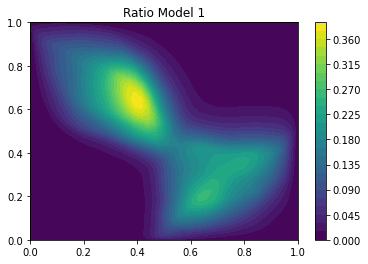

In [8]:
# contourf of ratios[0]

x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scipy.stats.norm.pdf(x) * scipy.stats.norm.pdf(y)

# Get the ratio
r = ratios[11](z.float()).detach().numpy()
Z = (r.reshape(100, 100)) * gauss
plt.contourf(scipy.stats.norm.cdf(x), scipy.stats.norm.cdf(y), Z, levels=30)
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.title('Ratio Model 1')  
plt.colorbar()
plt.show()

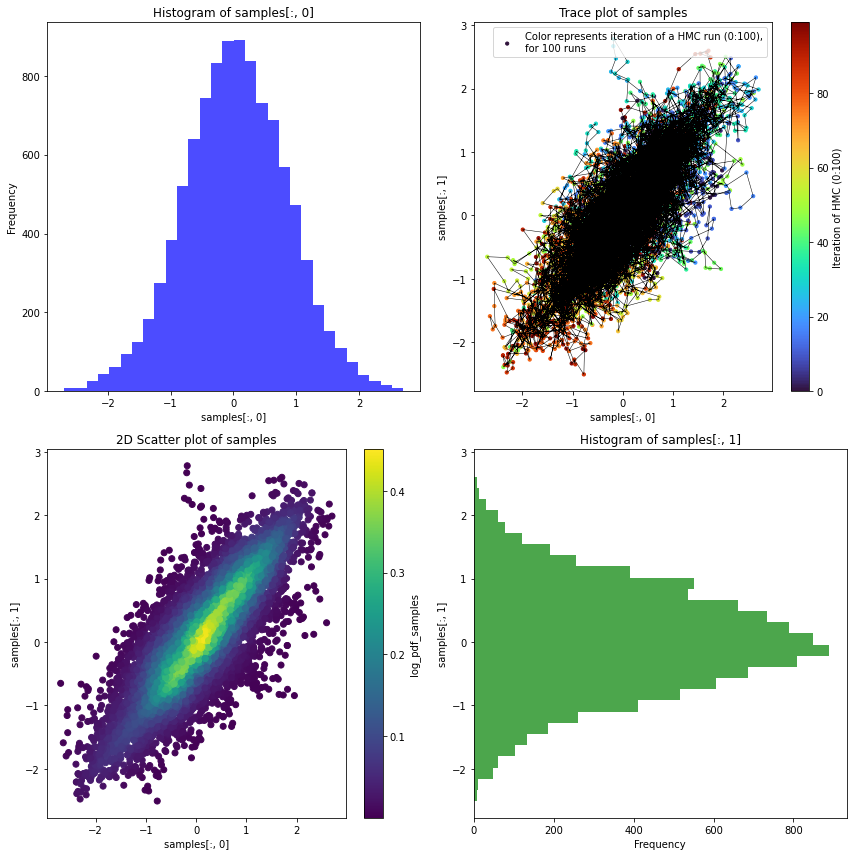

In [9]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming samples is a 2D array with shape (n_samples, 2)
# and log_pdf_samples is a 1D array with shape (n_samples,)

fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Subplot [0,0]: Histogram of samples[:, 0]
axs[0, 0].hist(samples[:, 0], bins=30, color='blue', alpha=0.7)
axs[0, 0].set_title('Histogram of samples[:, 0]')
axs[0, 0].set_xlabel('samples[:, 0]')
axs[0, 0].set_ylabel('Frequency')

# Subplot [1,1]: Histogram of samples[:, 1] rotated 90 degrees clockwise
axs[1, 1].hist(samples[:, 1], bins=30, color='green', alpha=0.7, orientation='horizontal')
axs[1, 1].set_title('Histogram of samples[:, 1]')
axs[1, 1].set_xlabel('Frequency')
axs[1, 1].set_ylabel('samples[:, 1]')

# Subplot [1,0]: 2D scatter plot of samples with colors based on log_pdf_samples
sc = axs[1, 0].scatter(samples[:, 0], samples[:, 1], c=np.exp(log_pdf_samples), cmap='viridis', marker='o')
axs[1, 0].set_title('2D Scatter plot of samples')
axs[1, 0].set_xlabel('samples[:, 0]')
axs[1, 0].set_ylabel('samples[:, 1]')
fig.colorbar(sc, ax=axs[1, 0], label='log_pdf_samples')

# Subplot [0,1]: Trace plot of samples
color_array = np.tile(np.arange(n_sims), n_runs)
sc_ = axs[0, 1].scatter(samples[:, 0], samples[:, 1], c=color_array, cmap='turbo', s=10)  # Set size of points
axs[0, 1].scatter(samples[:, 0], samples[:, 1], c=color_array, cmap='turbo', alpha=0.1, s=10)  # Set size of points
axs[0, 1].plot(samples[:, 0], samples[:, 1], color='black', linewidth=0.5)
axs[0, 1].set_title('Trace plot of samples')
axs[0, 1].set_xlabel('samples[:, 0]')
axs[0, 1].set_ylabel('samples[:, 1]')
fig.colorbar(sc_, ax=axs[0, 1], label=f'Iteration of HMC (0:{n_sims})')
legend_label = f'Color represents iteration of a HMC run (0:{n_sims}),\nfor {n_runs} runs'
axs[0, 1].legend([legend_label], loc='upper right')


plt.tight_layout()
plt.show()

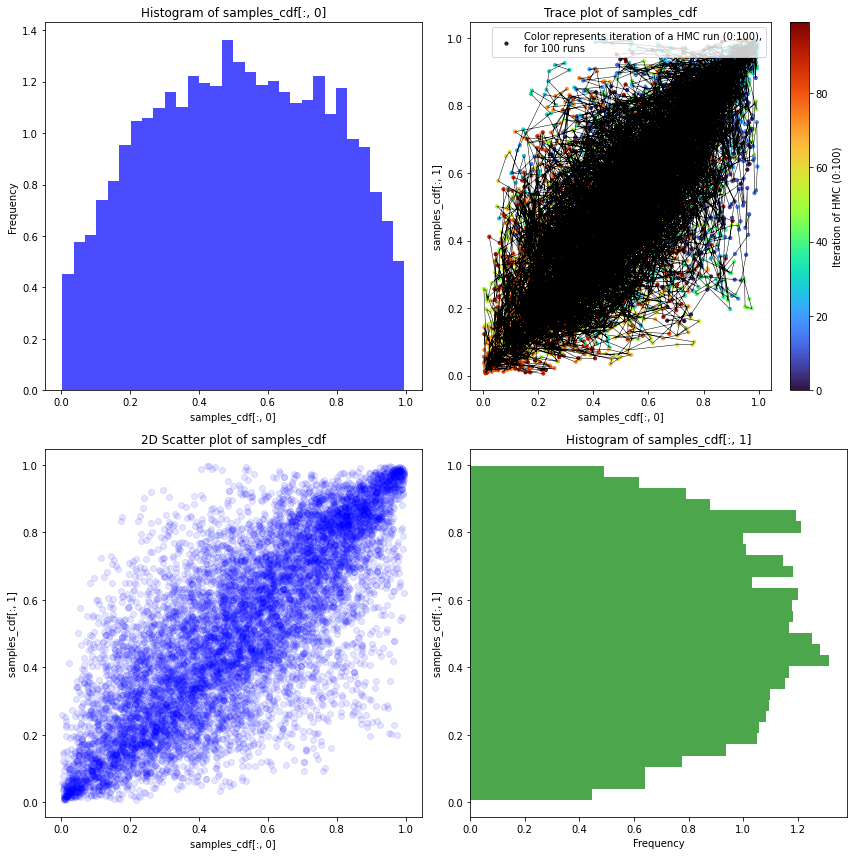

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as scs

# Assuming samples is a 2D array with shape (n_samples, 2)
# and log_pdf_samples is a 1D array with shape (n_samples,)

# Transform samples using the CDF
samples_cdf = scs.norm.cdf(samples)

fig, axs = plt.subplots(2, 2, figsize=(12, 12))

# Subplot [0,0]: Histogram of samples_cdf[:, 0]
axs[0, 0].hist(samples_cdf[:, 0], bins=30, color='blue', alpha=0.7,density=True)
axs[0, 0].set_title('Histogram of samples_cdf[:, 0]')
axs[0, 0].set_xlabel('samples_cdf[:, 0]')
axs[0, 0].set_ylabel('Frequency')

# Subplot [1,1]: Histogram of samples_cdf[:, 1] rotated 90 degrees clockwise
axs[1, 1].hist(samples_cdf[:, 1], bins=30, color='green', alpha=0.7, orientation='horizontal',density=True)
axs[1, 1].set_title('Histogram of samples_cdf[:, 1]')
axs[1, 1].set_xlabel('Frequency')
axs[1, 1].set_ylabel('samples_cdf[:, 1]')

# Subplot [1,0]: 2D scatter plot of samples_cdf with colors based on log_pdf_samples
sc = axs[1, 0].scatter(samples_cdf[:, 0], samples_cdf[:, 1], c='blue',alpha=0.1, marker='o')
axs[1, 0].set_title('2D Scatter plot of samples_cdf')
axs[1, 0].set_xlabel('samples_cdf[:, 0]')
axs[1, 0].set_ylabel('samples_cdf[:, 1]')
#fig.colorbar(sc, ax=axs[1, 0], label='log_pdf_samples')

# Subplot [0,1]: Trace plot of samples_cdf
color_array = np.tile(np.arange(n_sims), n_runs)
sc_ = axs[0, 1].scatter(samples_cdf[:, 0], samples_cdf[:, 1], c=color_array, cmap='turbo', s=10)  # Set size of points
axs[0, 1].scatter(samples_cdf[:, 0], samples_cdf[:, 1], c=color_array, cmap='turbo', alpha=0.1, s=10)  # Set size of points
axs[0, 1].plot(samples_cdf[:, 0], samples_cdf[:, 1], color='black', linewidth=0.5)
axs[0, 1].set_title('Trace plot of samples_cdf')
axs[0, 1].set_xlabel('samples_cdf[:, 0]')
axs[0, 1].set_ylabel('samples_cdf[:, 1]')
fig.colorbar(sc_, ax=axs[0, 1], label=f'Iteration of HMC (0:{n_sims})')
legend_label = f'Color represents iteration of a HMC run (0:{n_sims}),\nfor {n_runs} runs'
axs[0, 1].legend([legend_label], loc='upper right')

plt.tight_layout()
plt.show()

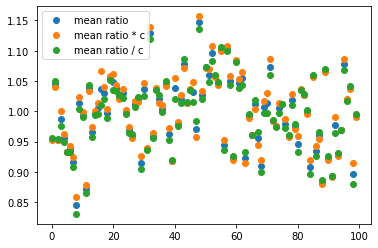

In [11]:
prop_scale = 1
r_idx = 6
out = []
for r_idx in range(len(ratios)):
    samples_gauss = torch.normal(mean=0., std=prop_scale, size=(10000, 2))
    r_gauss_1_2 = torch.distributions.Normal(loc=0., scale=1.).log_prob(samples_gauss).sum(1).detach().numpy()-torch.distributions.Normal(loc=0., scale=prop_scale).log_prob(samples_gauss).sum(1).detach().numpy()
    r_gauss = ratios[r_idx](samples_gauss).detach().numpy()/np.exp(r_gauss_1_2) 
    out.append(   [ r_gauss.mean(),r_gauss.mean()*ratios[r_idx].c.item(),r_gauss.mean()/ratios[r_idx].c.item()])

plt.plot([out[i][0] for i in range(len(ratios))],'o',label='mean ratio')
plt.plot([out[i][1] for i in range(len(ratios))],'o',label='mean ratio * c')
plt.plot([out[i][2] for i in range(len(ratios))],'o',label='mean ratio / c')
plt.legend()

In [12]:
import numpy as np
import scipy.stats as scs
from scipy.integrate import simps
import torch

# Define the grid
x = np.linspace(1e-5, 1-1e-5, 500)
y = np.linspace(1e-5, 1-1e-5, 500)
X, Y = np.meshgrid(x, y)

# Evaluate the function over the grid
Z = np.zeros_like(X)
for i in tqdm(range(len(x))):
    for j in range(len(y)):
        x_ = scs.norm.ppf(X[i, j])
        y_ = scs.norm.ppf(Y[i, j])
        Z[i, j] = ratios[-1](torch.tensor([x_, y_]).float()).detach().numpy()

# Integrate using Simpson's rule
integral = simps(simps(Z, y), x)

print(f"Integral result: {integral}")

100%|██████████| 500/500 [01:53<00:00,  4.39it/s]

Integral result: 0.993423868457321


### sampling with AIS

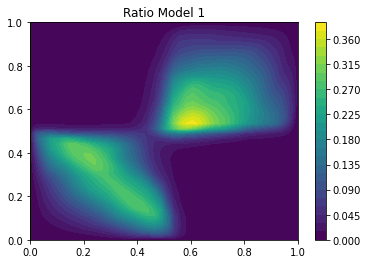

In [13]:
model_NB = 7

x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scipy.stats.norm.pdf(x) * scipy.stats.norm.pdf(y)

# Get the ratio
r = ratios[model_NB](z.float()).detach().numpy()
Z = (r.reshape(100, 100)) * gauss
plt.contourf(scipy.stats.norm.cdf(x), scipy.stats.norm.cdf(y), Z, levels=30)
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.title('Ratio Model 1')  
plt.colorbar()
plt.show()

In [14]:
import tensorflow as tf
import tensorflow_probability as tfp
import numpy as np
import torch
import torch.nn as nn
from pyhmc import hmc  
from tqdm import tqdm

# Define the ratio_model in PyTorch
class RatioModel(nn.Module):
    '''
    Pytorch ratio model.

    Args:
        ratio_model: The basic ratio model in pytorch.
    
    forward:
        Compute the log of ratio*gauss, which is the sampling density of the copula.
        inputs: The input to the ratio model.
            can be any array - is converted to torch.tensor inside.

    Returns:
        The log of the ratio model, as a numpy array.
    '''
    def __init__(self, ratio_model):
        super(RatioModel, self).__init__()
        self.ratio_model = ratio_model

    def forward(self, inputs):
        log_pdf, grad_x = self.log_r_times_gauss(inputs)
        return log_pdf

    def log_r_times_gauss(self, x):
        x_tensor = torch.tensor(x, dtype=torch.float32, requires_grad=True)
        fun = torch.log(self.ratio_model(x_tensor)) + torch.distributions.Normal(0, 1).log_prob(x_tensor).sum()
        fun.backward()
        grad_wrt_x = x_tensor.grad
        return np.array(fun.item(), dtype=np.float64), np.array(grad_wrt_x.detach().numpy(), dtype=np.float64)

ratio_model_instance = RatioModel(ratios[model_NB])

# Define the target log-density function
def target_log_prob_fn(x):
    # Convert TensorFlow tensor to NumPy array
    x_np = x
    # Compute log-density using the PyTorch model
    log_density = ratio_model_instance(x_np)
    # Convert the result to a TensorFlow tensor
    return tf.convert_to_tensor(log_density, dtype=tf.float32)

# Set up the AIS sampler
num_results = 500
num_burnin_steps = 100
num_steps = 10
inverse_temperatures = tf.linspace(0.0, 1.0, num_steps)

# Initial distribution: standard normal
initial_distribution = tfp.distributions.MultivariateNormalDiag(loc=[0., 0.], scale_diag=[1.5, 1.5])

# Run the AIS sampler
def run_ais():
    samples = []
    current_state = initial_distribution.sample(num_results).numpy()
    for beta in tqdm(inverse_temperatures):
        def tempered_log_prob_fn(x):
            x_tensor = torch.tensor(x, requires_grad=True, dtype=torch.float32)
            log_prob, grad = ratio_model_instance.log_r_times_gauss(x_tensor)
            log_prob = beta * log_prob + (1 - beta) * tf.reduce_sum(initial_distribution.log_prob(x_tensor.detach().numpy())).numpy().item()
            return log_prob, grad

        current_state = torch.tensor(current_state, dtype=torch.float32)
        samples1, _ = hmc(tempered_log_prob_fn,  # Use the tempered log prob function here
                          x0=current_state[0],
                          n_samples=int(num_results/2),
                          return_logp=True,
                          n_burn=num_burnin_steps)
        current_state = samples1
        samples.append(current_state)

    return tf.convert_to_tensor(np.concatenate(samples, axis=0), dtype=tf.float32)

samples = run_ais()

# Convert samples to NumPy array
samples_np_tf = samples.numpy()

# Print the shape of the samples
print(f"Shape of the samples: {samples_np_tf.shape}")


  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\david\AppData\Local\Temp\ipykernel_7772\3981766188.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32, requires_grad=True)
100%|██████████| 10/10 [02:09<00:00, 12.95s/it]

Shape of the samples: (2500, 2)


In [27]:
import torch
import torch.nn as nn
import torch.distributions as dist
import numpy as np
from pyhmc import hmc
from tqdm import tqdm

# Define the ratio_model in PyTorch
class RatioModel(nn.Module):
    '''
    Pytorch ratio model.

    Args:
        ratio_model: The basic ratio model in pytorch.
    
    forward:
        Compute the log of ratio*gauss, which is the sampling density of the copula.
        inputs: The input to the ratio model.
            can be any array - is converted to torch.tensor inside.

    Returns:
        The log of the ratio model, as a numpy array.
    '''
    def __init__(self, ratio_model):
        super(RatioModel, self).__init__()
        self.ratio_model = ratio_model

    def forward(self, inputs):
        log_pdf, grad_x = self.log_r_times_gauss(inputs)
        return log_pdf

    def log_r_times_gauss(self, x):
        x_tensor = torch.tensor(x, dtype=torch.float32, requires_grad=True)
        fun = torch.log(self.ratio_model(x_tensor)) + torch.distributions.Normal(0, 1).log_prob(x_tensor).sum()
        fun.backward()
        grad_wrt_x = x_tensor.grad
        return np.array(fun.item(), dtype=np.float64), np.array(grad_wrt_x.detach().numpy(), dtype=np.float64)

# Define the target log-density function
def target_log_prob_fn(x):
    x_tensor = torch.tensor(x, dtype=torch.float32)
    log_density = ratio_model_instance(x_tensor)
    return log_density

# Annealed Importance Sampling
def ais(num_samples, num_steps, initial_distribution, burn_steps):
    samples = initial_distribution.sample((num_samples,))
    inverse_temperatures = torch.linspace(0.0, 1.0, num_steps)

    for beta in tqdm(inverse_temperatures):
        def tempered_log_prob_fn(x):
            x_tensor = torch.tensor(x, requires_grad=True, dtype=torch.float32)
            log_prob, grad = ratio_model_instance.log_r_times_gauss(x_tensor)
            log_prob = beta * log_prob + (1 - beta) * initial_distribution.log_prob(x_tensor).sum().item()
            return log_prob, grad

        for i in range(num_samples):
            sample_np, _ = hmc(tempered_log_prob_fn,  # Use the tempered log prob function here
                               x0=samples[i].numpy(),
                               n_samples=1,
                               return_logp=True,
                               n_burn=burn_steps)
            samples[i] = torch.tensor(sample_np, dtype=torch.float32)

    return samples

# Example usage
ratio_model_instance = RatioModel(ratio_model=ratios[model_NB])  # Replace `your_ratio_model` with your actual model
initial_distribution = dist.MultivariateNormal(torch.zeros(2), torch.eye(2))
num_samples = 500
num_steps = 10
num_burn = 100

samples = ais(num_samples, num_steps, initial_distribution, num_burn)
samples_np_torch = samples.numpy()

print(f"Shape of the samples: {samples_np_torch.shape}")

  0%|          | 0/10 [00:00<?, ?it/s]C:\Users\david\AppData\Local\Temp\ipykernel_7772\3387605066.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_tensor = torch.tensor(x, dtype=torch.float32, requires_grad=True)
100%|██████████| 10/10 [18:03<00:00, 108.33s/it]

Shape of the samples: (500, 2)


In [28]:
samples_hmc, log_pdf_samples_hmc = sample_ratio(ratios[model_NB], n=500, hmc_runs=4, burn_in_n=10,bimodal_hmc=True)

run 0 DONE
run 1 DONE
run 2 DONE
run 3 DONE


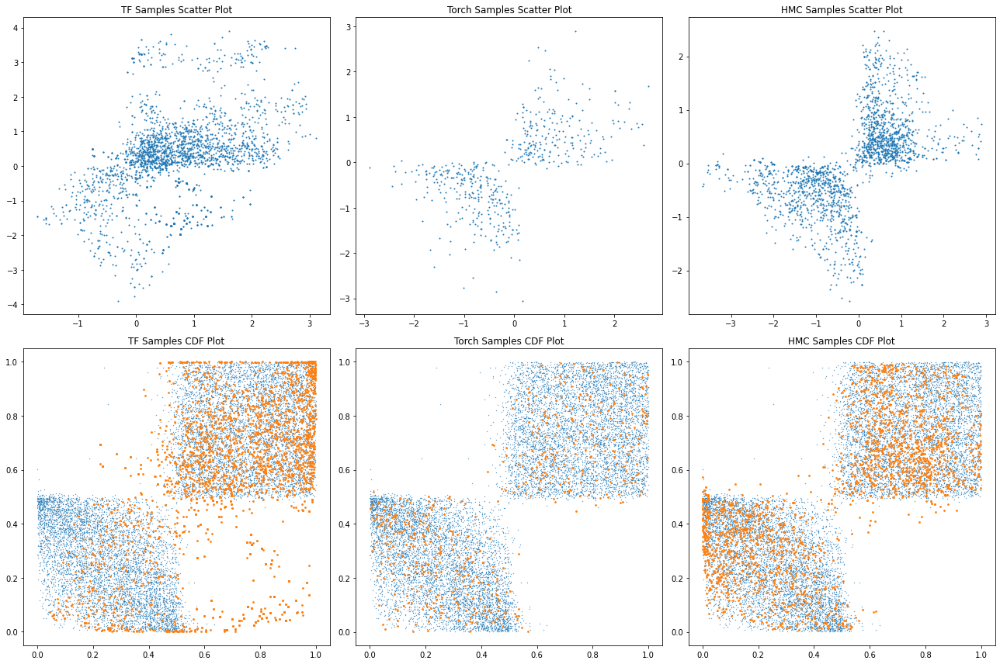

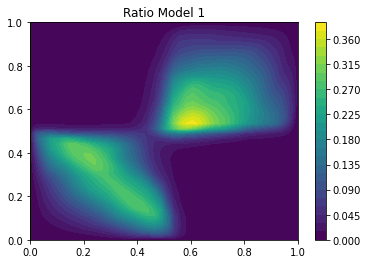

In [33]:
# plot the difference between the three samples
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

# First row: scatter plots
axs[0, 0].scatter(samples_np_tf[:, 0], samples_np_tf[:, 1], s=1)
axs[0, 0].set_title('TF Samples Scatter Plot')

axs[0, 1].scatter(samples_np_torch[:, 0], samples_np_torch[:, 1], s=1)
axs[0, 1].set_title('Torch Samples Scatter Plot')

axs[0, 2].scatter(samples_hmc[:, 0], samples_hmc[:, 1], s=1)
axs[0, 2].set_title('HMC Samples Scatter Plot')

# Second row: CDF plots
u1, u2 = sims_runs_all[model_NB//4][model_NB%4]
axs[1, 0].scatter(u1, u2, s=0.1)
axs[1, 0].scatter(scs.norm.cdf(samples_np_tf[:, 0]), scs.norm.cdf(samples_np_tf[:, 1]), s=3)
axs[1, 0].set_title('TF Samples CDF Plot')

axs[1, 1].scatter(u1, u2, s=0.1)
axs[1, 1].scatter(scs.norm.cdf(samples_np_torch[:, 0]), scs.norm.cdf(samples_np_torch[:, 1]), s=3)
axs[1, 1].set_title('Torch Samples CDF Plot')

axs[1, 2].scatter(u1, u2, s=0.1)
axs[1, 2].scatter(scs.norm.cdf(samples_hmc[:, 0]), scs.norm.cdf(samples_hmc[:, 1]), s=3)
axs[1, 2].set_title('HMC Samples CDF Plot')

plt.tight_layout()
plt.show()

# Plot the ratio model
x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scs.norm.pdf(x) * scs.norm.pdf(y)

# Get the ratio
r = ratios[7](z.float()).detach().numpy()
Z = (r.reshape(100, 100)) * gauss
plt.contourf(scs.norm.cdf(x), scs.norm.cdf(y), Z, levels=30)
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.title('Ratio Model 1')  
plt.colorbar()
plt.show()

### TRE

C:\Users\david\AppData\Local\Temp\ipykernel_7772\3586853456.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  alpha = torch.tensor(alpha)


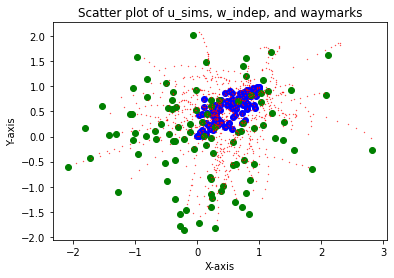

In [128]:
import matplotlib.pyplot as plt
import torch

# Define the slicing and bridges parameters
slice_ = 100
bridges = 10

# Scatter plot for u_sims and w_indep
plt.scatter(u_sims[:slice_, 0], u_sims[:slice_, 1], label='u_sims', color='blue')
plt.scatter(w_indep[:slice_, 0], w_indep[:slice_, 1], label='w_indep', color='green')

# Loop through i and scatter waymark points with gradient red color
for i in range(bridges):
    alpha = i / bridges
    w_ = waymark(u_sims[:slice_], w_indep[:slice_], torch.tensor(alpha))
    plt.scatter(w_[:, 0], w_[:, 1], color=(1, 0, 0,1), label=f'waymark {alpha:.1f}',s=0.1)

plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Scatter plot of u_sims, w_indep, and waymarks')
plt.show()

In [145]:
len(sims_runs_all[0][0][0])

6000

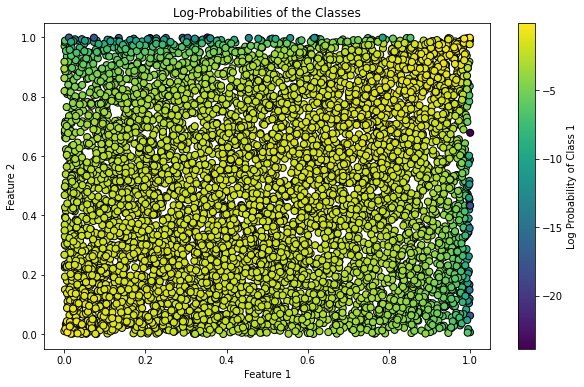

In [153]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
import matplotlib.pyplot as plt

slice_ = 1000 # adjust the number of training samples

u_cop = np.array(sims_runs_all[0][2]).T
z_cop = scs.norm.ppf(u_cop[:slice_])
z_indep = scs.norm.rvs(size=(u_cop.shape))

def train_poly_classifier(z_cop, z_indep, degree=4):
    ''' 
    Trains a logistic regression classifier on a polynomial expansion of the given data.

    Args:
        z_cop: The copula data. (n, dim)
        z_indep: The independent data. (n, dim)
        degree: The degree of the polynomial expansion including interactions. (scalar)

    Returns:
        model: The trained logistic regression model.\n
        poly: The polynomial feature transformer to get polynomial features of new data as poly.transform(new_data).
    '''
    # label and combine the data
    X = np.vstack((z_cop, z_indep))
    y = np.hstack((np.ones(z_cop.shape[0]), np.zeros(z_indep.shape[0])))

    # Create polynomial features up to order 4 for x1, x2, and their interaction up to order 2
    poly = PolynomialFeatures(degree=degree, include_bias=False)
    X_poly = poly.fit_transform(X)

    # Fit the logistic regression model
    model = LogisticRegression(solver='newton-cg')
    model.fit(X_poly, y)
    
    return model, poly


def plot_log_proba(model, poly, z_cop, z_indep, use_cdf=False):
    '''
    Plots the log-probabilities of the classes for the given data.

    Args:
        model: The trained logistic regression model.
        poly: The polynomial feature transformer.
        z_cop: The copula data. (n, dim)
        z_indep: The independent data. (n, dim)
        use_cdf: Boolean flag to use CDF of the input data for plotting.
    '''
    # Combine the data
    X = np.vstack((z_cop, z_indep))
    y = np.hstack((np.ones(z_cop.shape[0]), np.zeros(z_indep.shape[0])))

    # Transform the data using the polynomial feature transformer
    X_poly = poly.transform(X)

    # Get the log-probabilities
    log_proba = model.predict_log_proba(X_poly)

    # Optionally transform the data using the CDF
    if use_cdf:
        X = scs.norm.cdf(X)

    # Plot the log-probabilities
    plt.figure(figsize=(10, 6))
    plt.scatter(X[:, 0], X[:, 1], c=log_proba[:, 1], cmap='viridis', edgecolor='k', s=50)
    plt.colorbar(label='Log Probability of Class 1')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Log-Probabilities of the Classes')
    plt.show()


model, poly = train_poly_classifier(z_cop, z_indep, degree=4)
plot_log_proba(model, poly, z_cop, z_indep, use_cdf=True)  # Set use_cdf to True to use CDF for plotting

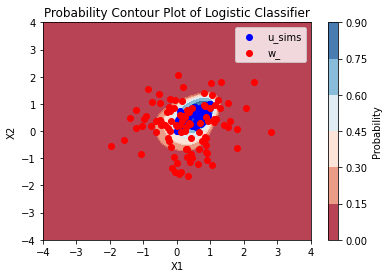

In [130]:

# Define the range for the mesh grid from -4 to 4
x_min, x_max = -4, 4
y_min, y_max = -4, 4
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Create polynomial features for the grid points
grid_points = np.c_[xx.ravel(), yy.ravel()]
grid_points_poly = poly.transform(grid_points)

# Predict probabilities for the grid points
proba = model.predict_proba(grid_points_poly)[:, 1]
proba = proba.reshape(xx.shape)

# Plot the contour of the probabilities
plt.contourf(xx, yy, proba, alpha=0.8, cmap=plt.cm.RdBu)
plt.colorbar(label='Probability')

# Scatter plot the original data points
plt.scatter(X[:slice_, 0], X[:slice_, 1], c='blue', label='u_sims')
plt.scatter(X[slice_:, 0], X[slice_:, 1], c='red', label='w_')
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('Probability Contour Plot of Logistic Classifier')
plt.legend()
plt.show()

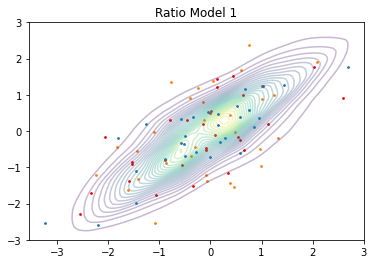

In [77]:
# contourf of ratio
x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
gauss = scipy.stats.norm.pdf(x) * scipy.stats.norm.pdf(y)
# Get the ratio
r = ratios[0](z.float()).detach().numpy()
Z = (r.reshape(100, 100)) * gauss
plt.contour(x, y, Z, levels=30,alpha=0.3)
plt.title('Ratio Model 1')  


def waymark(data_p, data_q, alpha):
    data_p = torch.tensor(data_p)
    data_q = torch.tensor(data_q)
    alpha = torch.tensor(alpha)
    return torch.sqrt(1 - alpha) * data_p + torch.sqrt(alpha) * data_q

u_1,u_2 = sims_runs_all[0][0][0],sims_runs_all[0][0][1]
z_1,z_2 = scs.norm.ppf(u_1)[:30],scs.norm.ppf(u_2)[:30]
z_ind_1,z_ind_2 = scs.norm.rvs(size=30), scs.norm.rvs(size=30)
plt.scatter(z_1, z_2, s=3,zorder=10)
plt.scatter(z_ind_1, z_ind_2, s=3)

#plot waymarks
zw_1 = waymark(z_1, z_ind_1,0.5)
zw_2 = waymark(z_2, z_ind_2,0.5)
plt.scatter(zw_1, zw_2, s=3,c='red')

In [ ]:
ratios = []

for r,run in tqdm(enumerate(sims_runs_all)):
    # run = [u1_student, u2_student], [u1_clayton, u2_clayton], [u1_gumbel, u2_gumbel],[ u_1_mix, u_2_mix]
    for u,u1_u2 in enumerate(run):
        # u1_u2 = [u1, u2]
        z1,z2 = scs.norm.ppf(u1_u2[0][:N_TRAIN]),scs.norm.ppf(u1_u2[1][:N_TRAIN])
        p_data = np.column_stack((z1,z2))
        p_data = np.nan_to_num(p_data, nan=0, posinf=0, neginf=0)
        q_data = np.random.randn(50000,2)
        # Fit Ratio copula
        ratio = Ratio(h_dim=100, in_dim=2, h_layers=2, normalising_cst=True)
        #optimizer = torch.optim.Adam(ratio.parameters())
        optimizer = torch.optim.Adam(
            [{'params': [param for param in ratio.parameters() if param is not ratio.c]},
            {'params': [ratio.c], 'lr': 0.001}]  # Adjust the learning rate for ratio.c here
        )
        #if ratio.normalising_cst:
        #    optimizer.add_param_group({'params': ratio.c})

        for epoch in (range(501)):
            optimizer.zero_grad()
            r_p = ratio(torch.tensor(p_data).float())
            r_q = ratio(torch.tensor(np.random.randn(p_data.shape[0],2)).float())
            #loss = (-(r_p /(1+r_p)).log() - (1/(1+r_q)).log() ).mean()
            loss = loss_nce(r_p, r_q, p_data.shape[0], q_data.shape[0])
            loss.backward()
            optimizer.step()
            if epoch % 100 == 0 and epoch > 0:
                with torch.no_grad():
                    if True:#epoch==500:# check the value and gradient of the normalising constant
                        print(f'Epoch {epoch}, normalising constant {ratio.c.item()}', ratio.c.grad.item())
                    #check if loss is not a number
                    if torch.isnan(loss):
                        print(r,u,'NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
                    #print(f'Epoch {epoch}, loss {loss.item()}')
        print('run',r,'cop_u',u,'DONE')
        ratios.append(ratio)


### Logistic classifier

In [30]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

class QuadraticNNHead(nn.Module):
    ''' 
    Quadratic neural network head model. Used inside W_Ratio model to
    map from (n,input_dim) of the hidden body to the (n,1) output.
    '''
    def __init__(self, input_dim):
        super(QuadraticNNHead, self).__init__()
        self.linear = nn.Linear(input_dim, 1)
        self.interaction_terms = nn.Parameter(0.001*torch.randn(input_dim, input_dim))

    def forward(self, x):
        linear_output = self.linear(x)
        interaction_output = torch.matmul(x.unsqueeze(2), x.unsqueeze(1))  # Shape: (batch_size, num_features, num_features)
        interaction_output = interaction_output * self.interaction_terms  # Element-wise multiplication
        interaction_output = interaction_output.sum()  # Sum over the feature dimensions
        output = linear_output + interaction_output
        return output



class W_Ratio(nn.Module):
    '''
    [W]aymark ratio copula model with a mixture of classifiers. 
    The mixing classifiers share the same hidden architecture but have different heads.
    Each mixture classifier is applied to a waymark dataset interpolating D_p and D_q.

    Args:
        h_dim (int): hidden dimension
        in_dim (int): input dimension
        h_layers (int): number of hidden layers
        w_num (int): number of classifiers in the mixture
    '''
    def __init__(self, h_dim=100, in_dim=2, h_layers=2, w_num=2, normalising_cst = False, c = 1.0):
        super(W_Ratio, self).__init__()

        self.h_dim = h_dim
        self.in_dim = in_dim
        self.h_layers = h_layers
        self.normalising_cst = normalising_cst
        if self.normalising_cst:
            self.c = nn.Parameter(torch.tensor(c))
        self.fc_in = nn.Linear(self.in_dim, self.h_dim)
        self.fc_hidden = nn.Linear(self.h_dim, self.h_dim)
        if w_num <2:
            raise ValueError('Number of waymark classifiers should be at least 2')
        self.w_num = w_num
        # Linear heads for each mixture classifier
        self.linear_heads = nn.ModuleList([nn.Linear(self.h_dim, 1) for _ in range(w_num)])
        # Quadratic heads for each mixture classifier
        self.quadratic_heads = nn.ModuleList([QuadraticNNHead(self.h_dim) for _ in range(w_num)]) 

    def waymark(self, data_p, data_q, alpha):
        return torch.sqrt(1 - alpha) * data_p + torch.sqrt(alpha) * data_q
        
    def hidden_body(self, x):
        x = F.relu(self.fc_in(x))
        for _ in range(self.h_layers):
            x = F.relu(self.fc_hidden(x)) + x
        return x
    
    def forward(self, x):
        out_ratio = []
        # common body pass
        x_waymark = self.hidden_body(x)
        for waymark in range(self.w_num):
            # Forward head pass
            out_ratio.append(self.quadratic_heads[waymark](x_waymark))
        out_ratio = torch.stack(out_ratio, dim=0)
        out_ratio = torch.logsumexp(out_ratio, dim=0) # numerically stable
        return out_ratio.exp()
    
    def forward_waymark(self, x, w_idx):
        # common body pass
        x_waymark = self.hidden_body(x)
        # Forward head pass
        #out_ratio = self.quadratic_heads[w_idx](x_waymark)
        out_ratio = self.linear_heads[w_idx](x_waymark)
        return out_ratio.exp()

# Define the ratio model
ratio_model = W_Ratio(h_dim=100, in_dim=2, h_layers=2, w_num=2)
#ratio_model(torch.randn(20, 2))
ratio_model.forward_waymark(torch.randn(20, 2), 0)


tensor([[1.0048],
        [0.6857],
        [1.2975],
        [0.7859],
        [1.2274],
        [1.3833],
        [1.1825],
        [0.5783],
        [0.4445],
        [0.5774],
        [0.6593],
        [1.0669],
        [1.5290],
        [0.7452],
        [0.6446],
        [0.5439],
        [0.7798],
        [0.6068],
        [0.6512],
        [1.3265]], grad_fn=<ExpBackward0>)

In [31]:
ratios_WAYMARK = []
W_NUM = 2

for r,run in tqdm(enumerate(sims_runs_all[:2])):
    # run = [u1_student, u2_student], [u1_clayton, u2_clayton], [u1_gumbel, u2_gumbel],[ u_1_mix, u_2_mix]
    for u,u1_u2 in enumerate(run):
        # u1_u2 = [u1, u2]
        z1,z2 = scs.norm.ppf(u1_u2[0][:N_TRAIN]),scs.norm.ppf(u1_u2[1][:N_TRAIN])
        p_data = np.column_stack((z1,z2))
        p_data = np.nan_to_num(p_data, nan=0, posinf=0, neginf=0)
        q_data = np.random.randn(50000,2)
        ratio_logstc = W_Ratio(h_dim=50, in_dim=2, h_layers=2, w_num=W_NUM)
        for w in range(W_NUM):
            # Fit Logistic Ratio copula
            optimizer = torch.optim.Adam(ratio_logstc.parameters(), lr=0.0001)
            w_alpha = torch.linspace(0,1,W_NUM+1)
            
            for epoch in (range(101)):
                p_data_w = ratio_logstc.waymark(torch.tensor(p_data).float(),  torch.randn(p_data.shape).float(), w_alpha[w])
                q_data_w = ratio_logstc.waymark(torch.tensor(p_data).float(), torch.randn(p_data.shape).float(), w_alpha[w+1])
                optimizer.zero_grad()
                r_p = ratio_logstc(torch.tensor(p_data_w).float())
                r_q = ratio_logstc(torch.tensor(q_data_w).float())
                #loss = (-(r_p /(1+r_p)).log() - (1/(1+r_q)).log() ).mean()
                loss = loss_nce(r_p, r_q, p_data.shape[0], q_data.shape[0])
                loss.backward()
                torch.nn.utils.clip_grad_norm_(ratio_logstc.parameters(), 1.)
                optimizer.step()
                if epoch % 100 == 0 and epoch > 0:
                    with torch.no_grad():
                        if ratio_logstc.normalising_cst:#epoch==500:# check the value and gradient of the normalising constant
                            print(f'Epoch {epoch}, normalising constant {ratio_logstc.c.item()}', ratio_logstc.c.grad.item())
                        #check if loss is not a number
                        if torch.isnan(loss):
                            print(r,u,'NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
                        #print(f'Epoch {epoch}, loss {loss.item()}')
        print('run',r,'cop_u',u,'DONE')
        ratios_WAYMARK.append(ratio_logstc)


0it [00:00, ?it/s]C:\Users\david\AppData\Local\Temp\ipykernel_7772\1984398003.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  r_p = ratio_logstc(torch.tensor(p_data_w).float())
C:\Users\david\AppData\Local\Temp\ipykernel_7772\1984398003.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  r_q = ratio_logstc(torch.tensor(q_data_w).float())


0 0 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
run 0 cop_u 0 DONE
0 1 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
run 0 cop_u 1 DONE
0 2 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
run 0 cop_u 2 DONE
0 3 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!


1it [00:46, 46.88s/it]

0 3 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
run 0 cop_u 3 DONE
1 0 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
1 0 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
run 1 cop_u 0 DONE
1 1 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
1 1 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
run 1 cop_u 1 DONE
1 2 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
1 2 NAN!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
run 1 cop_u 2 DONE


2it [01:34, 47.34s/it]

run 1 cop_u 3 DONE


c:\Users\david\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
c:\Users\david\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


ValueError: probabilities contain NaN

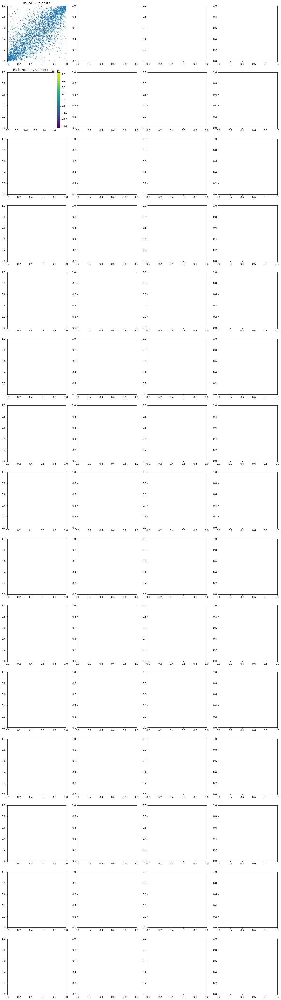

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import scipy.stats
from tqdm import tqdm
from scipy.special import logsumexp

def sample_ratio(ratio, n):
    '''
    Sample from the ratio copula with Sampling Importance Resampling.
    '''
    z = np.random.randn(n, 2)
    r_log = np.log(ratio(torch.tensor(z).float()).detach().numpy())
    sims = np.random.choice(np.arange(n), size=n, p=np.exp(r_log - logsumexp(r_log)).flatten(), replace=True)
    return scipy.stats.norm.cdf(z[sims])

fig, axes = plt.subplots(int(75/5), 4, figsize=(20, int(375/5)))
axes = axes.flatten()

sample_types = ["Student-t", "Clayton", "Gumbel", "Mixture of Gaussians"]

# Plot the true samples, the ratio models, and the sampled points
for i in range(5):
    for j in range(4):
        # Plot the true samples
        ax_true = axes[i * 12 + j]
        u1, u2 = sims_runs_all[i][j]
        ax_true.scatter(u1, u2, s=1)
        ax_true.set_xlim(0, 1)
        ax_true.set_ylim(0, 1)
        ax_true.set_title(f'Round {i+1}, {sample_types[j]}')

        # Plot the ratio models
        ax_ratio = axes[i * 12 + 4 + j]
        
        # Create a grid for plotting
        x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
        z = torch.tensor(np.column_stack((x.flatten(), y.flatten())))
        gauss = scipy.stats.norm.pdf(x) * scipy.stats.norm.pdf(y)

        # Get the ratio
        r = ratios_WAYMARK[i * 4 + j](z.float()).detach().numpy()
        Z = (r.reshape(100, 100)) * gauss
        contour = ax_ratio.contourf(scipy.stats.norm.cdf(x), scipy.stats.norm.cdf(y), Z, levels=30)
        ax_ratio.set_xlim(0, 1)
        ax_ratio.set_ylim(0, 1)
        ax_ratio.set_title(f'Ratio Model {i+1}, {sample_types[j]}')
        fig.colorbar(contour, ax=ax_ratio)
        
        # Plot the sampled points
        ax_sampled = axes[i * 12 + 8 + j]
        samples_test = sample_ratio(ratios_WAYMARK[i * 4 + j], 5000)
        ax_sampled.scatter(samples_test[:, 0], samples_test[:, 1], alpha=0.1)
        ax_sampled.set_xlim(0, 1)
        ax_sampled.set_ylim(0, 1)
        ax_sampled.set_title(f'Sampled Points {i+1}, {sample_types[j]}')

plt.tight_layout()
plt.show()